# Optimisation par essaims particulaires (Particle Swarm Optimization, PSO) 

In [2]:
import numpy as np
from pyswarm import pso
import deltapv as dpv

# Bornes pour les paramètres, comme dans votre exemple
bounds = [(3.0, 4.5), (1.0, 2.0), (5.0, 15.0), (1e16, 1e18), (1e18, 1e20), (50, 150), (50, 150), (1e-9, 1e-7), (1e-9, 1e-7), (1e3, 1e5)]

# Fonction objectif adaptée pour l'optimisation PSO
def objective_function(params):
    try:
        # Validation des paramètres
        if any(p < 0 for p in params):
            return float('inf')

        material_params = {
            'Chi': params[0],
            'Eg': params[1],
            'eps': params[2],
            'Nc': params[3],
            'Nv': params[4],
            'mn': params[5],
            'mp': params[6],
            'tn': params[7],
            'tp': params[8],
            'A': params[9]
        }

        material = dpv.create_material(**material_params)
        des = dpv.make_design(n_points=500, Ls=[1e-4, 1e-4], mats=material, Ns=[1e17, -1e17], Snl=1e7, Snr=0, Spl=0, Spr=1e7)
        results = dpv.simulate(des)

        max_power = results["iv"][1].max()
        if np.isnan(max_power):
            return float('inf')
        # Nous retournons l'opposé de la puissance maximale car PSO minimise la fonction objectif
        return -max_power
    except Exception as e:
        print(f"Error with parameters {params}: {e}")
        return float('inf')

# Conversion des bornes pour pyswarm
lb = [b[0] for b in bounds]  # Limites inférieures
ub = [b[1] for b in bounds]  # Limites supérieures

# Exécution de l'optimisation PSO
xopt, fopt = pso(objective_function, lb, ub, swarmsize=50, maxiter=40, minfunc=-1, minstep=1e-8)

print("Optimal parameters: ", xopt)
print("Maximum efficiency (negative of objective function): ", -fopt)


___________________    __
______ \ __  __ \_ |  / /
_  __  /__  /_/ /_ | / / 
/ /_/ / _  ____/__ |/ /  
\__,_/  /_/     _____/   
                         


Solving equilibrium...
    iteration   1    |p| = 7.82e+01    |F| = 1.46e+01
    iteration   2    |p| = 2.73e+01    |F| = 6.53e+00
    iteration   3    |p| = 2.14e+01    |F| = 3.34e+00
    iteration   4    |p| = 1.45e+01    |F| = 2.22e+00
    iteration   5    |p| = 6.93e+00    |F| = 1.58e+00
    iteration   6    |p| = 8.76e+00    |F| = 1.03e+00
    iteration   7    |p| = 8.94e+00    |F| = 6.62e-01
    iteration   8    |p| = 7.28e+00    |F| = 5.52e-01
    iteration   9    |p| = 4.90e+00    |F| = 4.40e-01
    iteration  10    |p| = 2.67e+00    |F| = 2.89e-01
    iteration  11    |p| = 9.51e-01    |F| = 1.10e-01
    iteration  12    |p| = 2.88e-07    |F| = 1.56e-09
Solving for 0.00 V (Step   0)...
    iteration   1    |p| = 1.00e+00    |F| = 2.02e+02
    iteration   2    |p| = 1.00e+00    |F| = 7.41e+01
    iteration   3    |p| = 1.00e+00    |F| = 1.14e+01
    iteration   4    |p| = 1.61e+00    |F| = 1.01e+00
    iteration   5    |p| = 1.70e+00    |F| = 1.35e-01
    iteration   6    |p| =

Stopping search: maximum iterations reached --> 40
Optimal parameters:  [3.11640798e+00 1.00000000e+00 1.50000000e+01 1.00000000e+18
 1.00000000e+18 1.34901960e+02 1.50000000e+02 1.00000000e-07
 1.00000000e-07 8.56394934e+04]
Maximum efficiency (negative of objective function):  0.04241457060349354


Affichage paremetre de l'algo d'optimisation par essaims particulaires

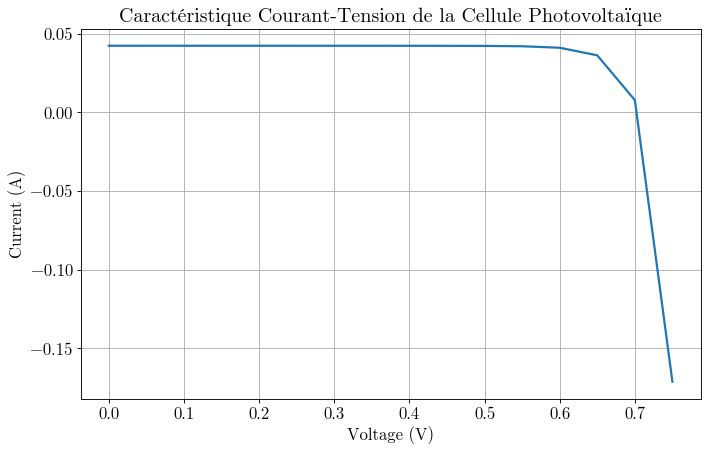

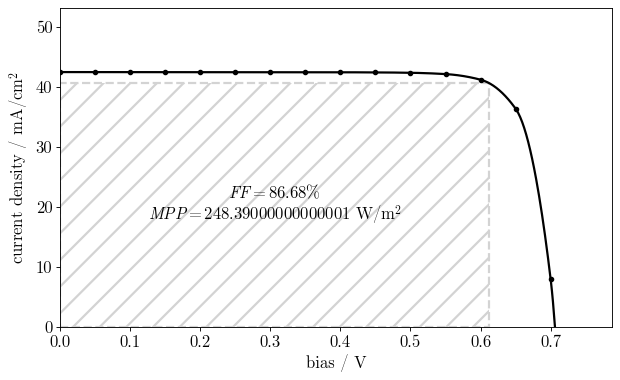

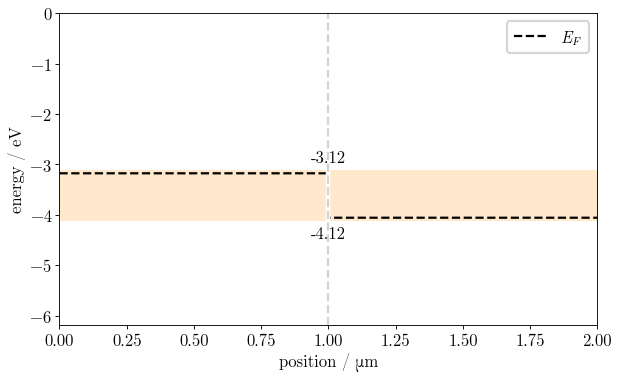

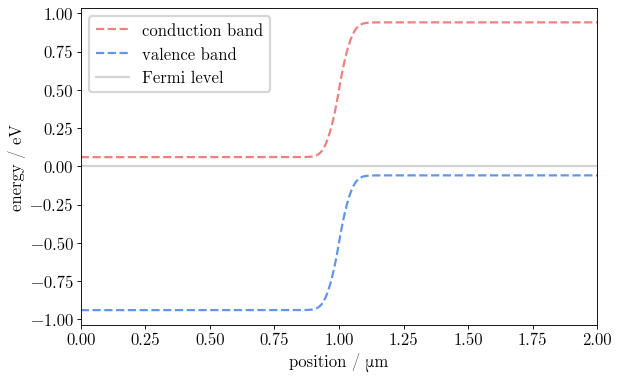

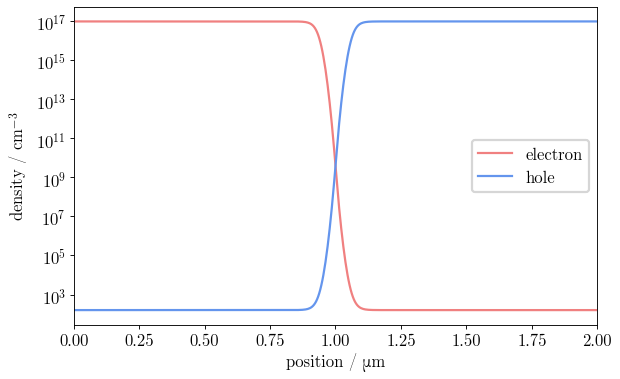

In [8]:
import deltapv as dpv
from jax import numpy as jnp, value_and_grad, jacobian
import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Meilleurs paramètres obtenus de l'algorithme génétique
best_individual = [3.11640798e+00, 1.00000000e+00, 1.50000000e+01, 1.00000000e+18,
                   1.00000000e+18, 1.34901960e+02, 1.50000000e+02, 1.00000000e-07,
                   1.00000000e-07, 8.56394934e+04]

# Utilisation des meilleurs paramètres pour créer le matériau
material_params = {
    'Chi': best_individual[0],
    'Eg': best_individual[1],
    'eps': best_individual[2],
    'Nc': best_individual[3],
    'Nv': best_individual[4],
    'mn': best_individual[5],
    'mp': best_individual[6],
    'tn': best_individual[7],
    'tp': best_individual[8],
    'A': best_individual[9]
}

material = dpv.create_material(**material_params)

# Création du design de la cellule
des = dpv.make_design(n_points=500, Ls=[1e-4, 1e-4], mats=material, Ns=[1e17, -1e17], Snl=1e7, Snr=0, Spl=0, Spr=1e7)

# Simulation
results = dpv.simulate(des)

# Affichage de la caractéristique courant-tension
voltage, current = results["iv"][0], results["iv"][1]
plt.figure(figsize=(10, 6))
plt.plot(voltage, current)
plt.xlabel('Voltage (V)')
plt.ylabel('Current (A)')
plt.title('Caractéristique Courant-Tension de la Cellule Photovoltaïque')
plt.grid(True)
plt.show()

# Affichage supplémentaire comme demandé
dpv.plot_iv_curve(*results["iv"])  # Courbe IV
dpv.plot_bars(des)  # Diagramme à barres
dpv.plot_band_diagram(des, results["eq"], eq=True)  # Diagramme des bandes
dpv.plot_charge(des, results["eq"])  # Distribution de charge


# Algorithme Génétique

In [ ]:
import random
import numpy as np
from deap import base, creator, tools, algorithms
import deltapv as dpv

import logging
logging.disable(logging.CRITICAL)  # Désactive tous les logs


# Définition des bornes pour les paramètres, comme dans l'exemple initial
bounds = [(3.0, 4.5), (1.0, 2.0), (5.0, 15.0), (1e16, 1e18), (1e18, 1e20), (50, 150), (50, 150), (1e-9, 1e-7), (1e-9, 1e-7), (1e3, 1e5)]

# Fonction objectif adaptée pour l'optimisation génétique
def objective_function(params):
    try:
        if any(p < 0 for p in params):
            return np.inf  

        material_params = dict(zip(['Chi', 'Eg', 'eps', 'Nc', 'Nv', 'mn', 'mp', 'tn', 'tp', 'A'], params))
        material = dpv.create_material(**material_params)
        des = dpv.make_design(n_points=500, Ls=[1e-4, 1e-4], mats=material, Ns=[1e17, -1e17], Snl=1e7, Snr=0, Spl=0, Spr=1e7)
        results = dpv.simulate(des)

        max_power = results["iv"][1].max()
        if np.isnan(max_power):
            return np.inf

        efficiency = -max_power  
        return efficiency
    except Exception as e:
        print(f"Error with parameters {params}: {e}")
        return np.inf


# Configuration DEAP pour l'algorithme génétique
creator.create("FitnessMax", base.Fitness, weights=(1.0,))
creator.create("Individual", list, fitness=creator.FitnessMax)

toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, 3.0, 4.5)  # À remplacer par la fonction d'initialisation
toolbox.register("individual", tools.initIterate, creator.Individual,
                 lambda: [random.uniform(b[0], b[1]) for b in bounds])
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

toolbox.register("evaluate", objective_function)
toolbox.register("mate", tools.cxUniform, indpb=0.5)  # Stratégie de croisement uniforme
toolbox.register("mutate", tools.mutPolynomialBounded, eta=0.1, low=[b[0] for b in bounds], up=[b[1] for b in bounds], indpb=0.2)
toolbox.register("select", tools.selRoulette)  # Méthode de sélection par roulette

# Création de la population initiale
population = toolbox.population(n=10) #100

# Sélection initiale des meilleurs individus pour le mécanisme élitiste
top_individuals = tools.selBest(population, k=10)  # Sélectionnez les 10 meilleurs individus de la population initiale

# Lancement de l'algorithme génétique
ngen = 50 #100
for gen in range(ngen):
    # Sélection et reproduction pour créer les nouveaux individus
    offspring = algorithms.varAnd(population, toolbox, cxpb=0.5, mutpb=0.2) #mutpb=0.1
    
    # Correction des valeurs hors limites après la mutation et le croisement
    for ind in offspring:
        for i, (low, up) in enumerate(bounds):
            if ind[i] < low:
                ind[i] = low
            elif ind[i] > up:
                ind[i] = up
    
    # Évaluation des nouveaux individus
    invalid_ind = [ind for ind in offspring if not ind.fitness.valid]
    fits = map(toolbox.evaluate, invalid_ind)
    for ind, fit in zip(invalid_ind, fits):
        ind.fitness.values = fit

    # Mise à jour de la population et conservation des meilleurs individus
    population[:] = offspring
    population += top_individuals  # Ajoutez les meilleurs individus de la génération précédente à la population
    top_individuals = tools.selBest(population, k=10)  # Sélectionnez les 10 meilleurs pour la prochaine génération

# Affichage du meilleur individu après la fin des générations
best_ind = tools.selBest(population, k=1)[0]
print("Best Individual: ", best_ind)
print("Best Fitness: ", best_ind.fitness.values[0])

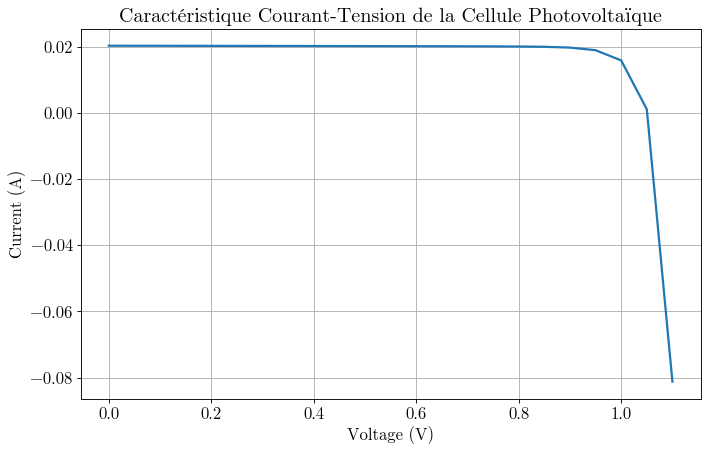

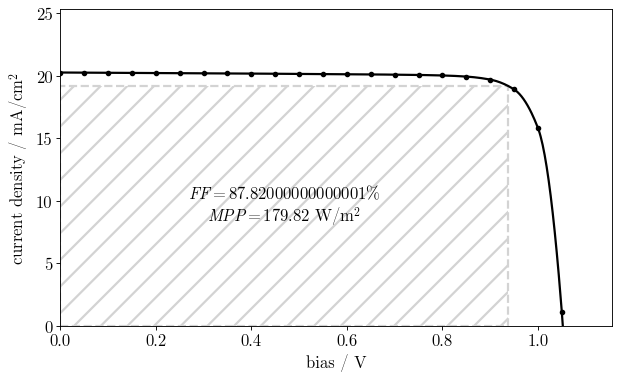

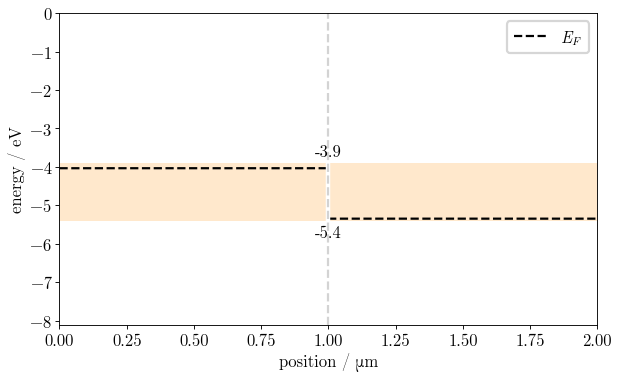

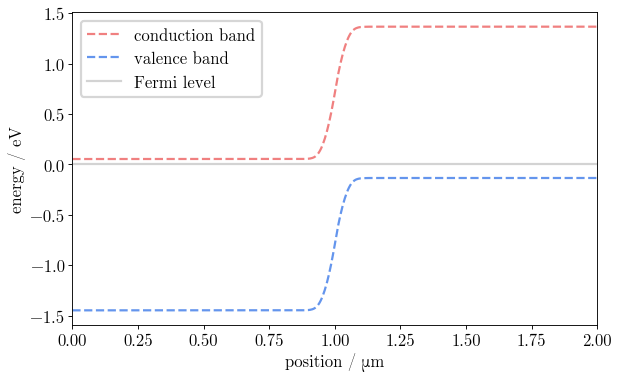

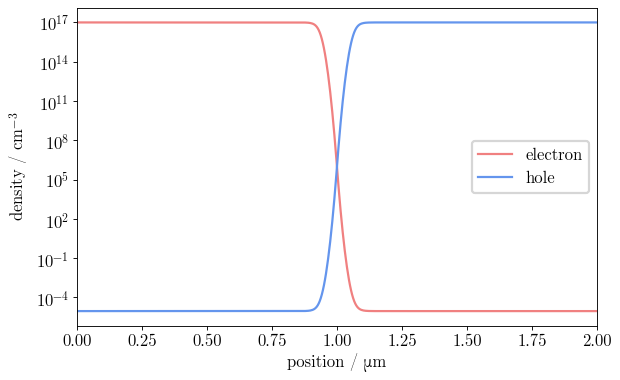

In [11]:
import deltapv as dpv
from jax import numpy as jnp, value_and_grad, jacobian
import numpy as np
from scipy.optimize import minimize
import matplotlib.pyplot as plt

# Meilleurs paramètres obtenus de l'algorithme génétique
best_individual = [
    3.9,         # Chi
    1.5,         # Eg
    9.4,         # eps
    8e17,        # Nc
    1.8e19,      # Nv
    100,         # mn
    100,         # mp
    1e-8,        # tn (remarque : Et n'était pas dans la liste originale, donc je suppose que vous vouliez tn ici)
    1e-8,        # tp
    20000        # A (2e4 en notation scientifique)
]


# Utilisation des meilleurs paramètres pour créer le matériau
material_params = {
    'Chi': best_individual[0],
    'Eg': best_individual[1],
    'eps': best_individual[2],
    'Nc': best_individual[3],
    'Nv': best_individual[4],
    'mn': best_individual[5],
    'mp': best_individual[6],
    'tn': best_individual[7],
    'tp': best_individual[8],
    'A': best_individual[9]
}

material = dpv.create_material(**material_params)

# Création du design de la cellule
des = dpv.make_design(n_points=500, Ls=[1e-4, 1e-4], mats=material, Ns=[1e17, -1e17], Snl=1e7, Snr=0, Spl=0, Spr=1e7)

# Simulation
results = dpv.simulate(des)

# Affichage de la caractéristique courant-tension
voltage, current = results["iv"][0], results["iv"][1]
plt.figure(figsize=(10, 6))
plt.plot(voltage, current)
plt.xlabel('Voltage (V)')
plt.ylabel('Current (A)')
plt.title('Caractéristique Courant-Tension de la Cellule Photovoltaïque')
plt.grid(True)
plt.show()

dpv.plot_iv_curve(*results["iv"])  # Courbe IV
dpv.plot_bars(des)  # Diagramme à barres
dpv.plot_band_diagram(des, results["eq"], eq=True)  # Diagramme des bandes
dpv.plot_charge(des, results["eq"])  # Distribution de charge
